# 0. Imports and useful functions

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency
from statsmodels.graphics.mosaicplot import mosaic

from sklearn.model_selection import cross_validate
import warnings

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import make_scorer, precision_recall_curve, auc, roc_auc_score, roc_curve,  classification_report, confusion_matrix

In [2]:
def cramers_corrected(x, y):
    """Calculate Cramers V statistic for categorical-categorical association.
    Uses correction from Bergsma and Wicher, Journal of the Korean Statistical Society 42 (2013): 323-328"""
    result = -1
    if len(x.value_counts()) == 1:
        print("First variable is constant")
    elif len(y.value_counts()) == 1:
        print("Second variable is constant")
    else:
        conf_matrix = pd.crosstab(x, y)

        if conf_matrix.shape[0] == 2:
            correct = False
        else:
            correct = True

        chi2 = chi2_contingency(conf_matrix, correction=correct)[0]

        n = sum(conf_matrix.sum())
        phi2 = chi2 / n
        r, k = conf_matrix.shape
        phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
        rcorr = r - ((r - 1) ** 2) / (n - 1)
        kcorr = k - ((k - 1) ** 2) / (n - 1)
        if (kcorr - 1) == 0 or (rcorr - 1) == 0:
            result = 0
        else:
            result = np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))
    return round(result, 6)

def cramers_v_matrix(df):
    cols = df.columns
    n = len(cols)
    result = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i == j:
                result[i, j] = 1.0
            else:
                confusion_matrix = pd.crosstab(df.iloc[:, i], df.iloc[:, j])
                result[i, j] = cramers_corrected(df.iloc[:, i], df.iloc[:, j])
    return pd.DataFrame(result, index=cols, columns=cols)


def plot_mosaic_plots(mod, target):
    variables = mod.drop(target, axis=1).select_dtypes(["object","category"]).columns.tolist()

    # Determine the target classes
    target_classes = mod[target].unique()

    if len(target_classes) != 2:
        raise ValueError("The target variable should have exactly 2 unique classes.")

    # Color mapping based on the target class order
    color_map = {
        target_classes[0]: '#22577A',
        target_classes[1]: '#FB3640'
    }

    for variable in variables:
        # Create a crosstab (contingency table) for each variable against the target
        table = pd.crosstab(mod[variable], mod[target])

        # Define the properties function as a lambda functio
        props = lambda key: {'color': color_map[int(key[1])]}

        print(f"Mosaic plot for {variable} vs {target}:\n")

        # Create mosaic plot with the properties lambda function
        mosaic(table.stack(), title=f"Mosaic Plot for {variable} vs {target}", properties=props)
        plt.show()
        print("-" * 50)


def model_evaluation(models, scores, X, y, splits, seed):
    results = []
    
    for name, model in models:
        warnings.filterwarnings('always')
        # KFold
        KF = StratifiedKFold(n_splits=splits, shuffle=True, random_state=seed)

        # Cross_val
        cv_results = cross_validate(model, X, y, cv=KF, scoring=scores, verbose=False)

        # Store results for each fold and each metric
        for fold in range(splits):
            result = {"Model": name, "Fold": fold + 1}
            for score in scores:
                result[score] = cv_results[f"test_{score}"][fold]
            results.append(result)

        # Print results numerically
        print(f'--\n{name} model:')
        for key in scores:
            print("%s: mean %f, std (%f) " % (key, cv_results[f"test_{key}"].mean(), cv_results[f"test_{key}"].std()))

    return pd.DataFrame(results)


def plot_ROC_PR_curve(y_test,y_proba, title):
    # Calculate ROC curve and ROC AUC
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = roc_auc_score(y_test, y_proba)

    # Calculate Precision-Recall curve and AUC
    precision, recall, _ = precision_recall_curve(y_test, y_proba)
    pr_auc = auc(recall, precision)

    # Plot ROC curve
    plt.figure(figsize=(12, 5))
    plt.suptitle(title)
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')

    # Plot Precision-Recall curve
    plt.subplot(1, 2, 2)
    plt.plot(recall, precision, color='blue', label=f'PR curve (area = {pr_auc:.4f})')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall (PR) Curve')
    plt.legend(loc='lower left')

    plt.tight_layout()
    plt.show()


# 1. Data load, preliminary analysis and cleaning

In [3]:
df = pd.read_csv("churn_all.csv")
df.head()

,state,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,Churn
0,KS,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


Let's check the dtypes of features are correct and if there are any obvious missing values:

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   object 
 1   area_code                      5000 non-null   int64  
 2   phone_number                   5000 non-null   object 
 3   international_plan             5000 non-null   object 
 4   voice_mail_plan                5000 non-null   object 
 5   number_vmail_messages          5000 non-null   int64  
 6   total_day_minutes              5000 non-null   float64
 7   total_day_calls                5000 non-null   int64  
 8   total_day_charge               5000 non-null   float64
 9   total_eve_minutes              5000 non-null   float64
 10  total_eve_calls                5000 non-null   int64  
 11  total_eve_charge               5000 non-null   float64
 12  total_night_minutes            5000 non-null   f

The are no obvious missing values, but data types are not entirely correct in some cases.

In [5]:
df["area_code"] = df["area_code"].astype("category")
df["state"] = df["state"].astype("category")
df["international_plan"] = df["international_plan"].astype("category")
df["voice_mail_plan"] = df["voice_mail_plan"].astype("category")

In [6]:
df["Churn"] = df["Churn"].astype(int)

Let's check the target imbalance:

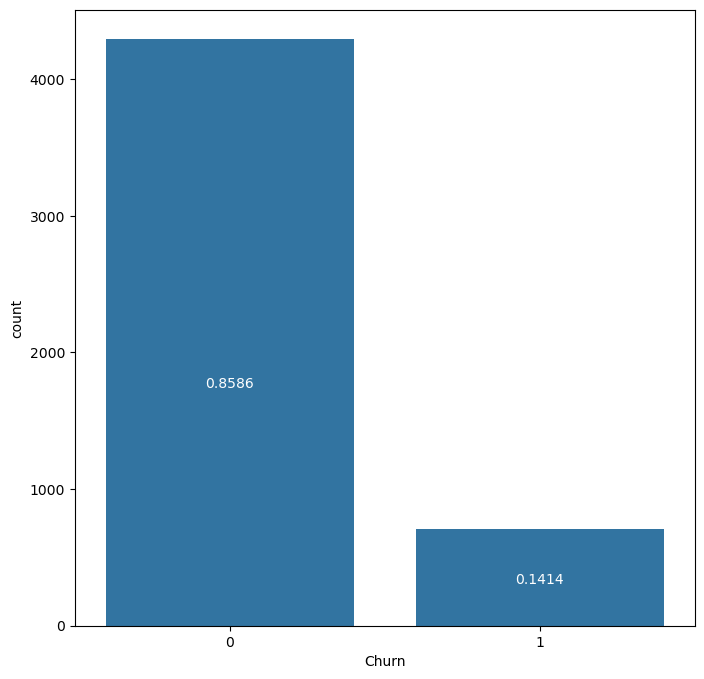

In [7]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.countplot(data = df, x="Churn")
for bar in ax.patches:
    height = bar.get_height()
    x_position = bar.get_x() + bar.get_width() / 2
    ax.text(x_position, height/2 - height/2*0.2, height/df.shape[0], ha='center', va='bottom', color='white')

Next, evaluating numerical features ranges is necessary to not overlook any encoded missing values or incorrectly out of logical bound value, like negative calls for instance. Additionally, this can give an idea about univariate outliers.

In [8]:
df.describe()

,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,Churn
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,7.755200,180.288900,119.834000,30.649668,200.636560,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400,0.141400
std,13.546393,53.894699,442.739543,9.162069,50.551309,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363,0.348469
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000,0.000000
50%,0.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,17.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000,0.000000
max,52.000000,351.500000,9999.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000


All features seem good, no outliers or out-of-bound values, except for the *9999* value in total_day_calls, that looks like an encoding for a missing value.

<Axes: xlabel='total_day_calls', ylabel='Count'>

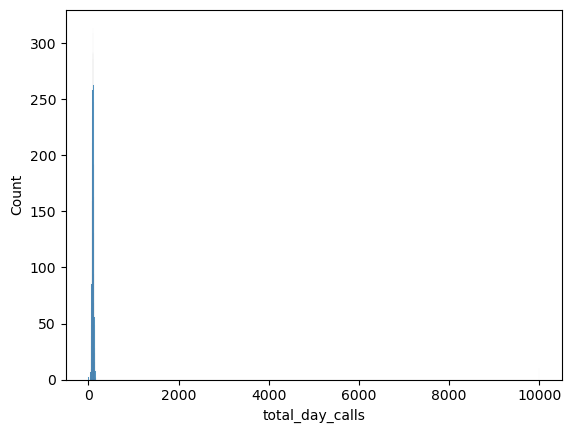

In [9]:
sns.histplot(df,x="total_day_calls")

Although it could be suspected by the distance between quantiles 75 and 100, the above chart makes it visually obvious that the *9999* value was actually an encoding for a missing value. Correcting it:

C:\Users\Miguel\AppData\Local\Temp\ipykernel_7484\2435496248.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["total_day_calls"].replace(9999, np.nan, inplace=True)


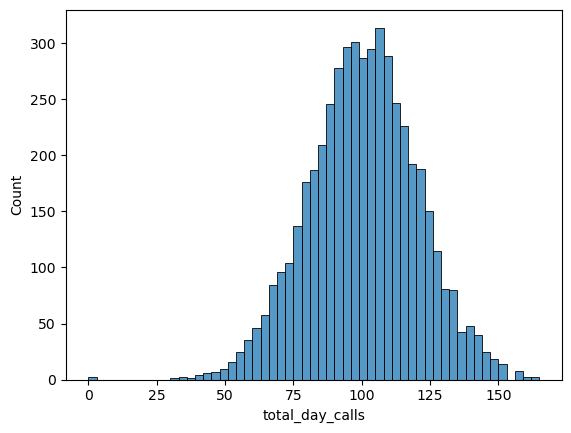

There are 10 missing values in the total_day_calls column.


In [10]:
df["total_day_calls"].replace(9999, np.nan, inplace=True)
sns.histplot(df,x="total_day_calls")
plt.show()

print("There are", df["total_day_calls"].isnull().sum(), "missing values in the total_day_calls column.")

These missing values can be imputed by the mean in this case without any major impact to the model. However, a pipelined imputation method is preferable due to it being robust to data leakage.

In [11]:
# df["total_day_calls"].fillna(df["total_day_calls"].mean(), inplace=True)

# 2. EDA

Mosaic plot for state vs Churn:



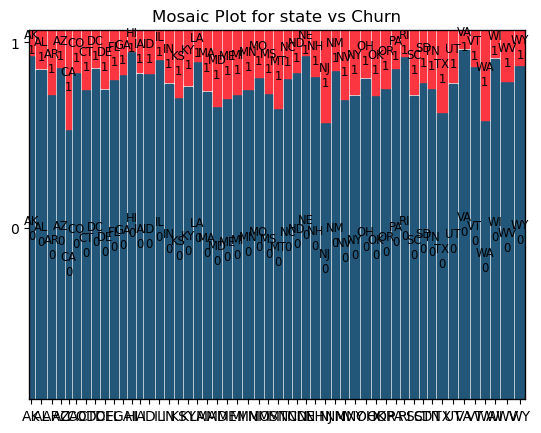

--------------------------------------------------
Mosaic plot for area_code vs Churn:



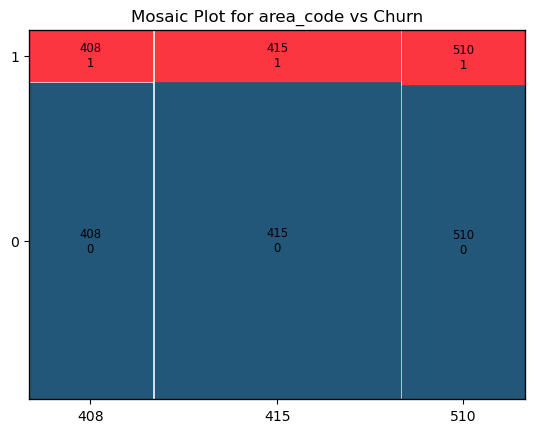

--------------------------------------------------
Mosaic plot for international_plan vs Churn:



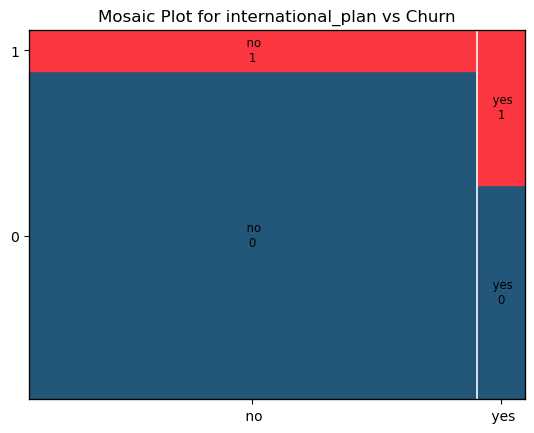

--------------------------------------------------
Mosaic plot for voice_mail_plan vs Churn:



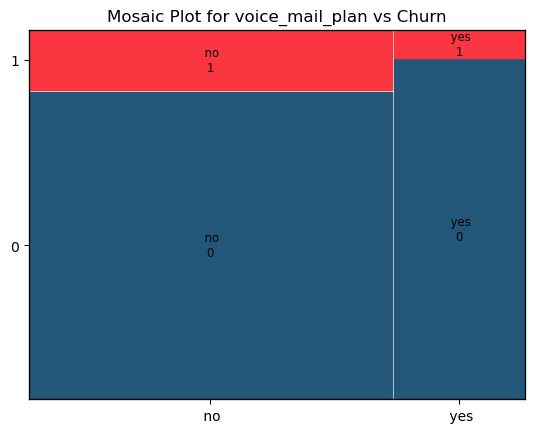

--------------------------------------------------


In [12]:
plot_mosaic_plots(df.drop(["phone_number"],axis=1),"Churn")

- State: There is high variance of churn between states. As proved below, rates per minute are very similar per state, so another explanation might be the presence of strong competition in those states that present high churn rates. Thus state can be a strong predictor of churn.
- Area_code: Churn variance is negligible here, therefore this feature will not be selected for the final model.
- International_plan: Easy differentiation for churn between international plan and no international plan. Adding an international must add a sum to the overall final price of the bill.
- Voice_mail_plan: Not such a big variance as for the international plan, but but worth including nonetheless. 

In [13]:
df["avg_day_charge_per_minute"] = df["total_day_charge"] / df["total_day_minutes"]
df["avg_eve_charge_per_minute"] = df["total_eve_charge"] / df["total_eve_minutes"]
df["avg_night_charge_per_minute"] = df["total_night_charge"] / df["total_night_minutes"]

df.groupby("state").agg({"avg_day_charge_per_minute": "mean", "avg_eve_charge_per_minute": "mean", "avg_night_charge_per_minute": "mean"})

C:\Users\Miguel\AppData\Local\Temp\ipykernel_7484\3376718757.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby("state").agg({"avg_day_charge_per_minute": "mean", "avg_eve_charge_per_minute": "mean", "avg_night_charge_per_minute": "mean"})


,avg_day_charge_per_minute,avg_eve_charge_per_minute,avg_night_charge_per_minute
state,,,
AK,0.170002,0.085000,0.044998
AL,0.170001,0.085001,0.045001
AR,0.170003,0.085001,0.045002
AZ,0.170002,0.085001,0.045003
CA,0.170003,0.085003,0.045001
CO,0.170002,0.084999,0.045005
CT,0.170002,0.085001,0.045002
DC,0.170009,0.085003,0.045001
DE,0.170005,0.085003,0.045001


The above calculation shows that not only there is no variation between states rates, it also shows that rates between times of the day are different and tend to be more affordable as the day comes to an end.

In [14]:
print("Average day charge per minute: ", np.mean(df["avg_day_charge_per_minute"]))
print("Average evening charge per minute: ", np.mean(df["avg_eve_charge_per_minute"]))
print("Average night charge per minute: ", np.mean(df["avg_night_charge_per_minute"]))

Average day charge per minute:  0.17000326121841491
Average evening charge per minute:  0.08500122140555388
Average night charge per minute:  0.045000537253483845


Now, knowing that rates are different throughout the day, it is worth observing the numerical relationships among features. For that purpose, a glance at a pairplot can allow to quickly identify feature to feature relationships, their individual distributions and in the case of a categorical or binary target, how the pairwise feature relationship interacts with the target.

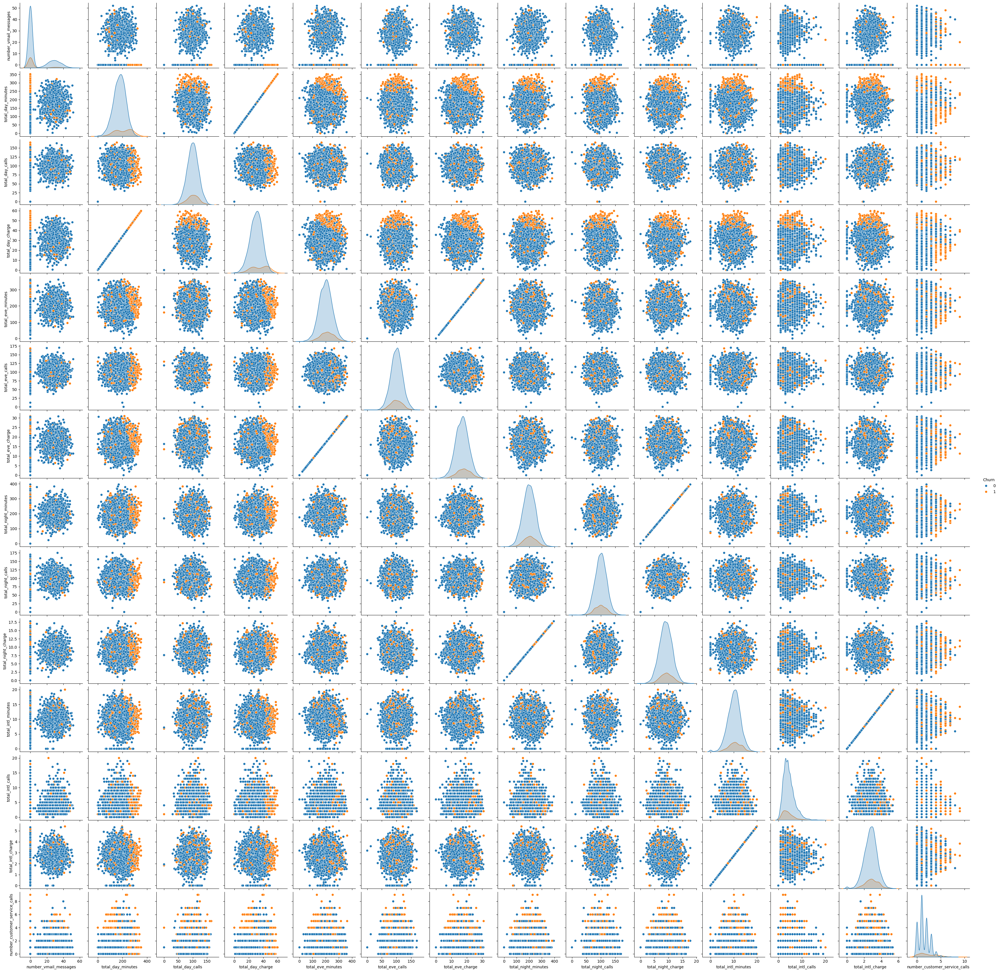

In [15]:
to_drop = ["avg_day_charge_per_minute", "avg_eve_charge_per_minute", "avg_night_charge_per_minute"]
           
sns.pairplot(df.drop(to_drop,axis=1), hue="Churn")
plt.show()

Three things quickly stand out: 
- Total minutes and total charge of any time of the day are perfectly proportional. That means rates are equal for everyone, just different throughtout the day as showed previously.
- High differentiation between churners and non-churners is observed through the total_day_minutes and total_day_charges along with any feature. The same cannot be said about the other times of the day.
- Number_customer_service_calls does not have many levels of representation, thus it is not easily inspected through scatterplots. It also means that this feature could be treated as a category, as additionally the relationship, although positive, is not perfectly linear.

The first and second point are related, so let's tackle those first. A zoom into the distribution of total_day_minutes can help distinguish a threshold of change in churn.

<Axes: xlabel='total_day_minutes', ylabel='Count'>

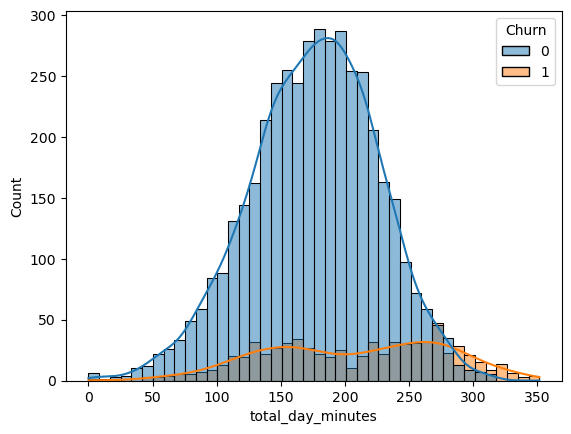

In [16]:
sns.histplot(df,x="total_day_minutes",hue="Churn", kde=True)

People who use the phone more during daytime pay higher rates, so the total charge can be a useful feature to calculate and explore.

In [17]:
df["total_calls"] = df["total_day_calls"] + df["total_eve_calls"] + df["total_night_calls"] + df["total_intl_calls"]
df["total_minutes"] = df["total_day_minutes"] + df["total_eve_minutes"] + df["total_night_minutes"] + df["total_intl_minutes"]
df["total_charge"] = df["total_day_charge"] + df["total_eve_charge"] + df["total_night_charge"] + df["total_intl_charge"]

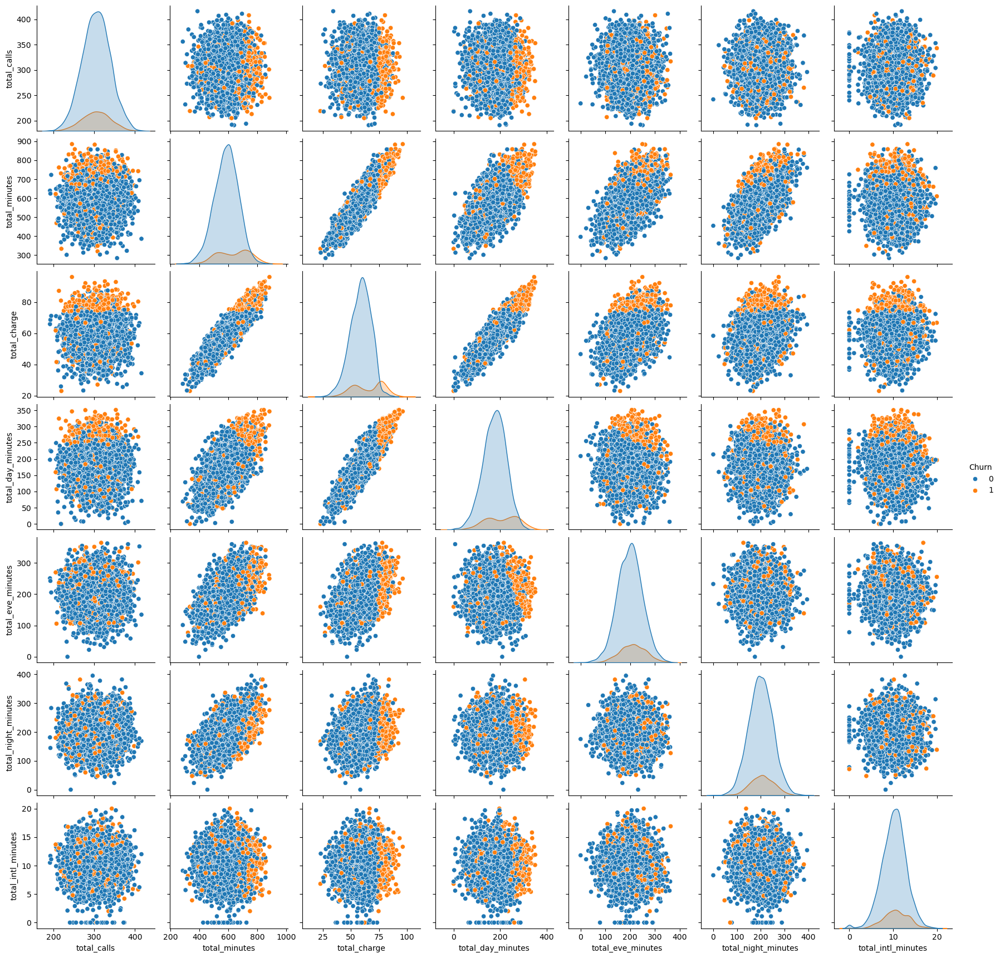

In [18]:
sns.pairplot(df[["total_calls", "total_minutes", "total_charge", "total_day_minutes", "total_eve_minutes", "total_night_minutes", "total_intl_minutes", "Churn"]], hue="Churn")

### Creation of new categorical value

As anticipated, the total_day_minutes are a big driver of the price up. Therefore, as establishing a categorical feature based on two levels of consumption is necessary, this levels can be stablished around the apparent threshold for churn in total_day_minutes, clients that speak 250 minutes or more during the morning.

Mosaic plot for high_morning_use vs Churn:



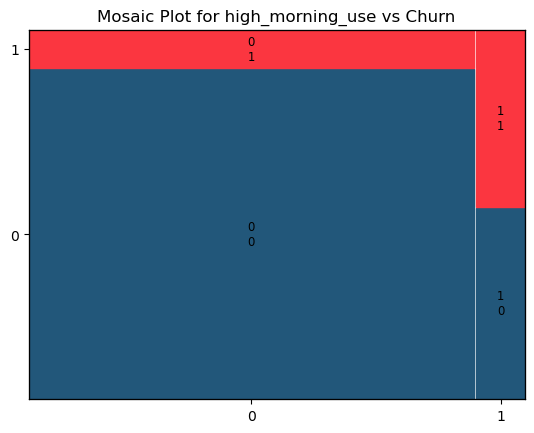

--------------------------------------------------


In [19]:
df["high_morning_use"] = np.where(df["total_day_minutes"] >= 250, 1, 0)
df["high_morning_use"] = df["high_morning_use"].astype("category")

plot_mosaic_plots(df[["high_morning_use","Churn"]],"Churn")

Now to better visualize Number_customer_service_calls vs. Churn, plotting a boxplot shows that churn is more prevalent as calls to customer service increse. It would be a helpful indicator to add the customer satisfaction after those calls.

<Axes: ylabel='number_customer_service_calls'>

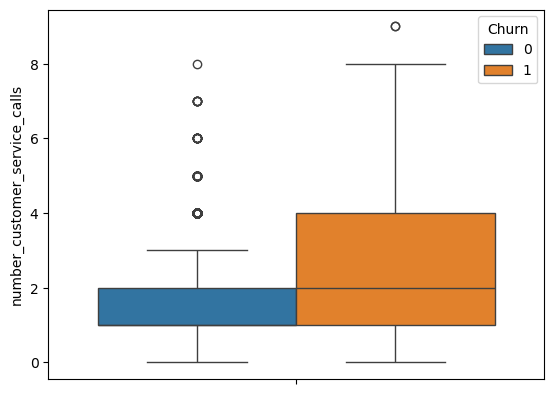

In [20]:
sns.boxplot(data=df, hue="Churn", y="number_customer_service_calls")

A few other things are worth questioning:
- Does the international plan influence the rates? The first scatterplot below shows that there is no difference in minute price apparently, which could explain why there could be higher bill cost that is not mitigated by a discount in minute price.
- Are customers without voice_mail_plan able to send voice_mails, perhaps at a higher rate than with it? The second scatterplot discards that possibility for this data.

<Axes: xlabel='total_intl_charge', ylabel='total_intl_minutes'>

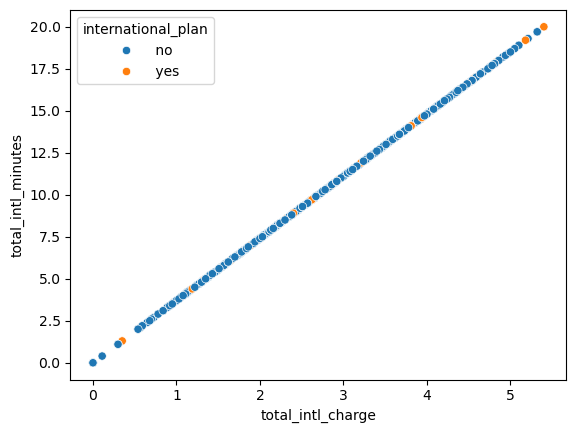

In [21]:
sns.scatterplot(data=df, y="total_intl_minutes", x="total_intl_charge", hue="international_plan")

<Axes: xlabel='number_vmail_messages', ylabel='total_charge'>

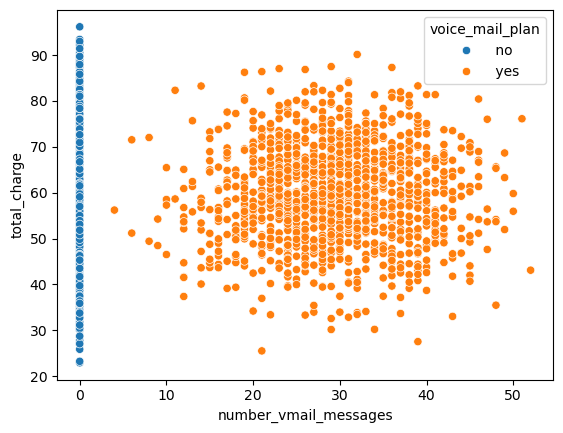

In [22]:
sns.scatterplot(data=df, y="total_charge", x="number_vmail_messages", hue="voice_mail_plan")

The strength of feature relationships can be further supperted via a correlation heatmap to numerically assess their linear correlation. Additionally, a Cramer's V correlation matrix can be helpful in identifying non-linear relationships, although it should be interpreted with care as it can sometimes prove too optimistic. Before doing that, an additional avg_charge_per_minute feature can be added as a summary of the minutes consumed share among day times.

<Axes: >

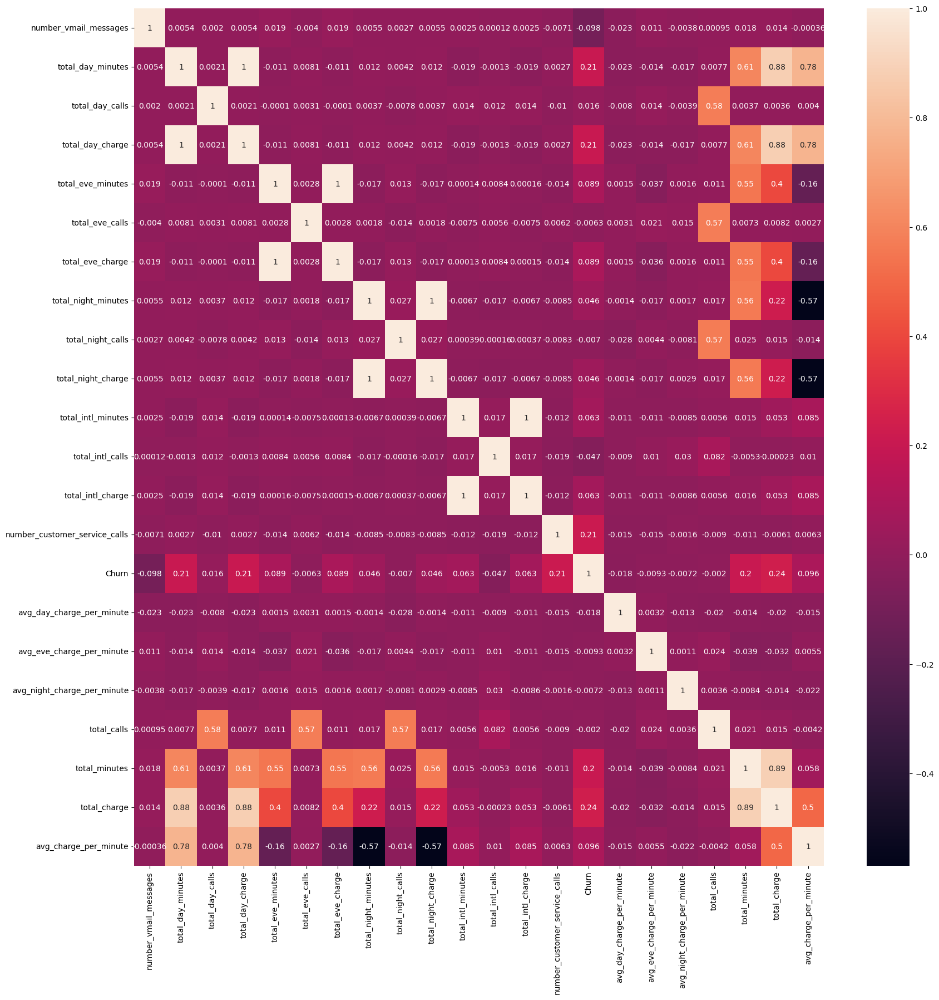

In [23]:
df["avg_charge_per_minute"] = df["total_charge"] / df["total_minutes"]

plt.figure(figsize=(20, 20))
sns.heatmap(df.corr(numeric_only=True), annot=True)

<Axes: >

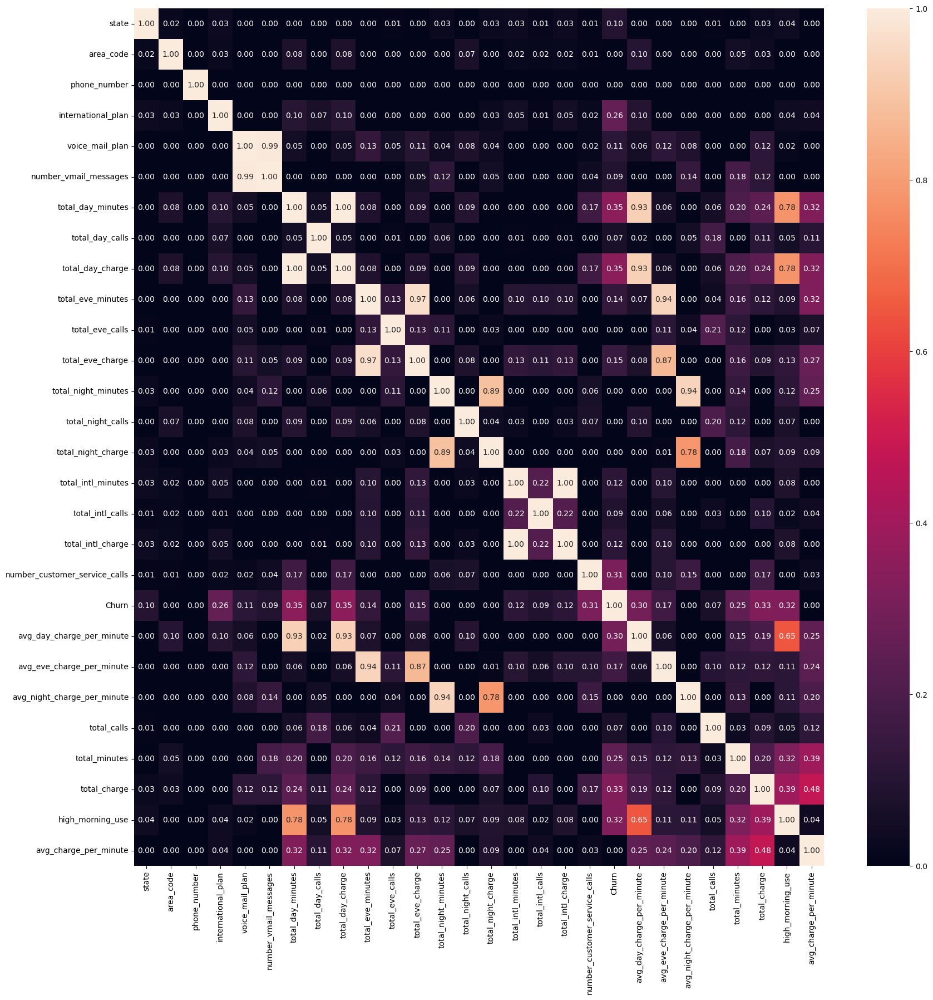

In [24]:
plt.figure(figsize=(20, 20))
sns.heatmap(cramers_v_matrix(df), annot=True, fmt=".2f")

Selection of variables
- state
- international_plan
- voice_mail_plan
- number_customer_service_calls
- total_charge
- avg_charge_per_minute

State and international_plan are categorical features that capture information that no ther feature does, showing high feature-target correlation and variance, and low feature-feature correlation. Voice_mail_plan summarizes the information provided by the numerical feature number_vmail_messages.

Number_customer_service_calls potentially is potentially correlated with customer disatisfaction. It should be included in the model, as a categorical feature given the low number of levels or unique values it presents.. The facts that it presents a higher Cramer's V coefficient than Pearson's gives the indication that the relationship might not be linear.

Total_charge and avg_charge_per_minute take the information from daily use at different times and summarize it, avoiding a multi-collinearity issue that is problematic for linear models.

As a whole, this selection of variables can through enough condensed information into a simple model that provides high explainability of high value for business know-how as well as decision-making, besides it's use as an in-production predictive model.

# 3. Additional preparation for modelling

All categories should have at least a 2.5-5% (or 20-30 observations) representation per category to ensure statistical significance of the results. Checking below, it is observed that this is not the case for all categories, so they should be grouped.

In [25]:
for column in ["state", "international_plan", "voice_mail_plan", "number_customer_service_calls"]:
    display(df[column].value_counts(normalize=True))

state
WV    0.0316
MN    0.0250
AL    0.0248
ID    0.0238
VA    0.0236
OH    0.0232
TX    0.0232
WY    0.0230
OR    0.0228
NY    0.0228
NJ    0.0224
UT    0.0224
WI    0.0212
MI    0.0206
ME    0.0206
MA    0.0206
MD    0.0204
VT    0.0202
RI    0.0198
MT    0.0198
MS    0.0198
KY    0.0198
KS    0.0198
CT    0.0198
IN    0.0196
WA    0.0196
CO    0.0192
NH    0.0190
DE    0.0188
MO    0.0186
AR    0.0184
NC    0.0182
SC    0.0182
NM    0.0182
FL    0.0180
OK    0.0180
NV    0.0180
AZ    0.0178
TN    0.0178
NE    0.0176
ND    0.0176
DC    0.0176
IL    0.0176
HI    0.0172
SD    0.0170
GA    0.0166
LA    0.0164
PA    0.0154
AK    0.0144
IA    0.0138
CA    0.0104
Name: proportion, dtype: float64

international_plan
no     0.9054
yes    0.0946
Name: proportion, dtype: float64

voice_mail_plan
no     0.7354
yes    0.2646
Name: proportion, dtype: float64

number_customer_service_calls
1    0.3572
2    0.2254
0    0.2046
3    0.1330
4    0.0504
5    0.0192
6    0.0068
7    0.0026
9    0.0004
8    0.0004
Name: proportion, dtype: float64

International_plan and voice_mail_plan have well represented categories. However, this is not the case for the other two.

In [26]:
sorted_state_categories = df.groupby('state')['Churn'].mean().sort_values()

group_labels = pd.qcut(range(len(sorted_state_categories)), 10, labels=False)

category_group_map = pd.Series(group_labels, index=sorted_state_categories.index)

df['grouped_states'] = df['state'].map(category_group_map).astype('category')

C:\Users\Miguel\AppData\Local\Temp\ipykernel_7484\1263347073.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sorted_state_categories = df.groupby('state')['Churn'].mean().sort_values()


Mosaic plot for grouped_states vs Churn:



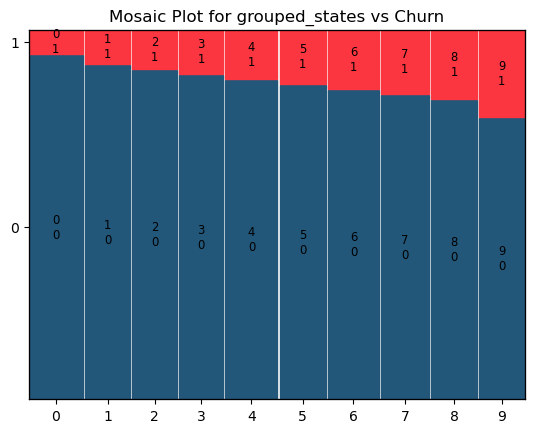

--------------------------------------------------


In [232]:
plot_mosaic_plots(df[["grouped_states","Churn"]],"Churn")

In [234]:
df["number_customer_service_calls"] = df["number_customer_service_calls"].astype("int")

In [240]:
df["grouped_customer_service_calls"] = np.where(df["number_customer_service_calls"] >= 4, ">4", df["number_customer_service_calls"])
df["grouped_customer_service_calls"] = df["grouped_customer_service_calls"].astype("category")

Mosaic plot for grouped_customer_service_calls vs Churn:



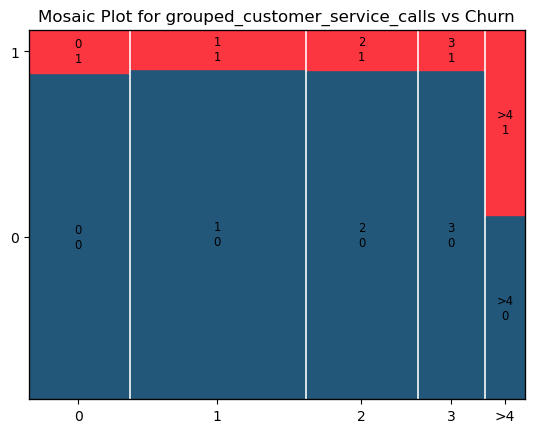

--------------------------------------------------


grouped_customer_service_calls
1     1786
2     1127
0     1023
3      665
>4     399
Name: count, dtype: int64

In [241]:
plot_mosaic_plots(df[["grouped_customer_service_calls","Churn"]],"Churn")
df["grouped_customer_service_calls"].value_counts()

# 4. Modelling

## 4.1 Metric choice

Due to the high imbalance of the dataset, special attention will be put towards AUC and AUC-PR (area under the Precision Recall curve). These two metrics act as a summary of TP, TN and Precision, Recall measurements and it's potential to perform better via threshold modification. Just plain accuracy is misleading, given that predicting just "no churn" would yield a 84% of accuracy due to target imbalance. 

For finding the optimal threshold, in case both FP and FN are just as problematic, f1-score is the go-to metric. Otherwise, deciding on a business optimal % of recall or precision can be used to look for the optimal threshold.

## 4.2 Validation strategy

A k-fold cross-validation strategy is chosen for model validation. The relatively small sample forces to use bootstapping to make model performance assessment more reliable, although the number of folds should not go too high, depending on the number of parameters of the given model in order to prevent overfitting due to local small sample within the model.

In [242]:
seed = 7

X = df[["grouped_states", "international_plan", "voice_mail_plan", "grouped_customer_service_calls", "total_charge", "avg_charge_per_minute"]]
y = df["Churn"]

X_train, X_test, y_train, y_test = train_test_split(X,y,stratify=y, random_state=seed)

In [339]:
models = [
        ("Logistic",LogisticRegression(random_state=seed)),
        ("RandomForest", RandomForestClassifier(random_state=seed)),
        ("DecisionTree",DecisionTreeClassifier(random_state=seed))
]


numerical_transformer = Pipeline([('imputer',SimpleImputer(strategy="median")),("scaler",StandardScaler())])
categorical_transformer = Pipeline([('imputer',SimpleImputer(strategy="most_frequent")),("encoder",OneHotEncoder(drop="first"))])

data_prep = ColumnTransformer(transformers=[
    ("numeric",numerical_transformer,["total_charge","avg_charge_per_minute"]),
    ("categorical",categorical_transformer,["grouped_states", "international_plan", "voice_mail_plan", "grouped_customer_service_calls"]),
], remainder="drop")

pipelines = []
for name, model in models:
    pipeline = make_pipeline(data_prep, model)
    pipelines.append((name+"_1", pipeline))


In [340]:
def auc_pr_scorer(y_true, y_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    return auc(recall, precision)

pr_auc_scorer = make_scorer(auc_pr_scorer, response_method="predict_proba")

evaluation_scores = {'roc_auc_pr':pr_auc_scorer,'roc_auc':'roc_auc','f1':'f1'}
n_splits = 5

In [341]:
evaluation = model_evaluation(pipelines, evaluation_scores,X_train,y_train,n_splits,seed)

--
Logistic_1 model:
roc_auc_pr: mean 0.495270, std (0.048740) 
roc_auc: mean 0.863741, std (0.016089) 
f1: mean 0.286028, std (0.058569) 
--
RandomForest_1 model:
roc_auc_pr: mean 0.846312, std (0.027336) 
roc_auc: mean 0.919309, std (0.016175) 
f1: mean 0.782983, std (0.031780) 
--
DecisionTree_1 model:
roc_auc_pr: mean 0.739819, std (0.021932) 
roc_auc: mean 0.839617, std (0.020496) 
f1: mean 0.718687, std (0.025056) 


,pr_auc_mean,pr_auc_std
Model,,
DecisionTree_1,0.739819,0.024521
Logistic_1,0.495270,0.054493
RandomForest_1,0.846312,0.030563


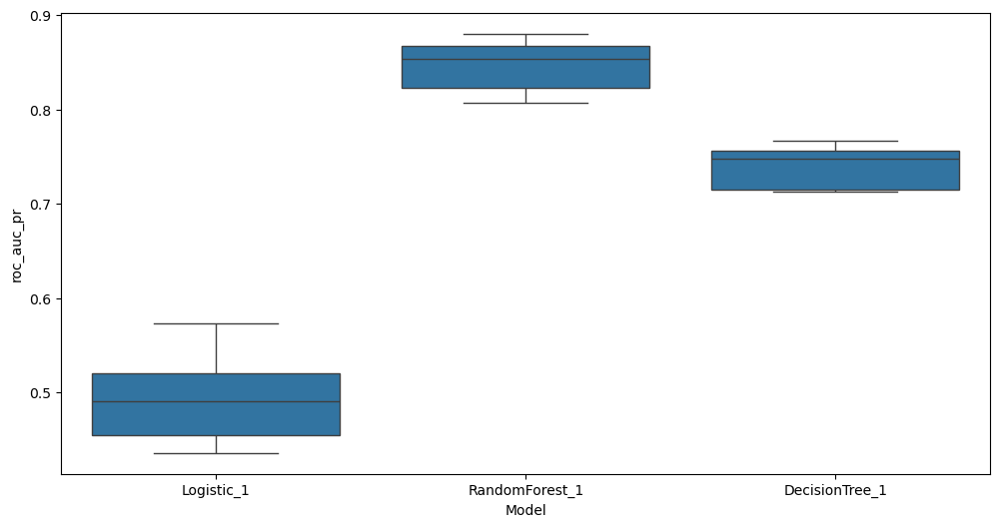

In [342]:
fig = plt.figure(figsize=(12,6))
sns.boxplot(data=evaluation,x="Model",y="roc_auc_pr")
evaluation.groupby("Model").agg(pr_auc_mean=("roc_auc_pr","mean"),pr_auc_std=("roc_auc_pr","std"))

As can be seen, although the Logistic Regression posseses a greater explainability, the Random Forest model surpasses the prior by 5% in AUC and 35% in AUC-PR, besides a great f1 score from the beginning with just the default 0.5 threshold. Therefore, this makes it the optimal model to put into production in terms of accuracy performance. 

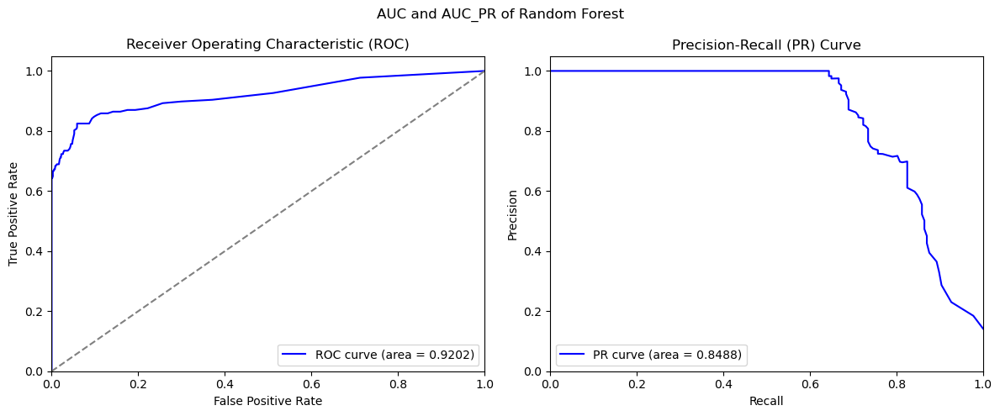

In [343]:
rf_pipeline = pipelines[1][1]
rf_pipeline.fit(X_train, y_train)

y_prob = rf_pipeline.predict_proba(X_test)[:,1]

plot_ROC_PR_curve(y_test,y_prob,"AUC and AUC_PR of Random Forest")

              precision    recall  f1-score   support

           0       0.97      0.94      0.95      1073
           1       0.70      0.81      0.75       177

    accuracy                           0.92      1250
   macro avg       0.83      0.88      0.85      1250
weighted avg       0.93      0.92      0.93      1250



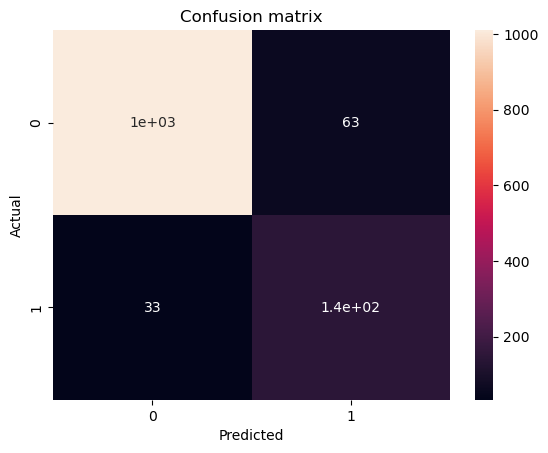

In [355]:
y_pred = (y_prob > 0.2).astype(int)
fig, ax = plt.subplots()
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True)
ax.set_title("Confusion matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
print(classification_report(y_test,y_pred))

## 4.3 Final comments on model selection

As stated right above, the decision threshold should be modified in order to satisfy business requirement. That is, to shift it below or above 0.5 to better capture all possible churns, to only capture those that are most certain or via an optimisation function where the cost of churn is contrasted with the cost of retention campaign per customer like:

- cost_churn = $360
- cost_campaign = $10 
- function to optimise = (($360 - $10) * TP) - ($10 * FP)

Also, other models could have been evaluated and those and the already evaluated ones could have had their hyperarameters tuned to squeeze the maximum accuracy out of them. For instance, lasso regression instead of a plain logistic regression could have been tuned to perform "automatic" feature selection, obtaining better results.

# 5. Variable contribution (Feature importances)

To assess feature contribution to the model, two approaches are available:
- Feature importances from tree models
- Logistic regression coefficients

The first option only provides quantifiable information about the relative influence of a feature to the model with respect to other features, its weight. While the second provides a simple equation that can be used to obtain the probability of a certain observation to be churn based on the fitted model. Both methods are out of the box and limited to these algorithms. Let's calculate both and discuss the results.

As a point of future development/improvement, an evaluation of SHAP values would allow these models or a less explainable model to be explained on a deeper level with a detailed model agnostic techniques.

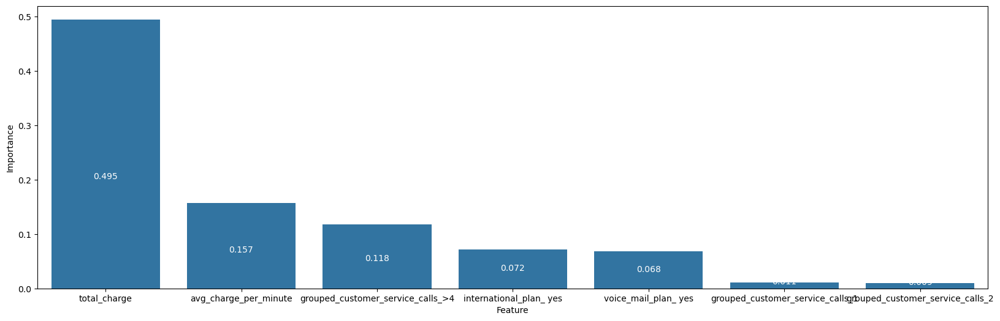

In [344]:
rf_model = rf_pipeline.named_steps['randomforestclassifier']

importances = rf_model.feature_importances_

feature_names = (rf_pipeline.named_steps['columntransformer']
                 .transformers_[0][1]['scaler']
                 .get_feature_names_out(["total_charge", "avg_charge_per_minute"])
                 .tolist() +
                 rf_pipeline.named_steps['columntransformer']
                 .transformers_[1][1]['encoder']
                 .get_feature_names_out(["grouped_states", "international_plan", "voice_mail_plan", "grouped_customer_service_calls"])
                 .tolist())

feature_importances_df = pd.DataFrame({'Feature': feature_names,'Importance': importances}).sort_values(by='Importance', ascending=False)

fig, ax = plt.subplots(figsize=(20,6))
sns.barplot(data=feature_importances_df.iloc[:7],x="Feature",y="Importance")
for bar in ax.patches:
    height = bar.get_height()
    x_position = bar.get_x() + bar.get_width() / 2
    ax.text(x_position, height/2 - height/2*0.2, np.round(height,3), ha='center', va='bottom', color='white')
plt.show()

The random forest, which had a very good performance but could still interpret features wrong, found that the 2 engineered features about how much customers pay in total and how much they pay for their calls to be the most significant. This alings with what was observed through pairwise relationship with the target, where there was clear separation for churn customers based on what they pay in total but especially in the mornings. It also makes sense that another feature that is important is the one_hot_encoding of the feature engineered category of customer_service_calls of 4 or greater, indicating that chance of churn increases considerably when customers start to call too frequently. The fact that international_plan and voice_mail_plan are also on the top alings with what was explored through correlation plots.

The only expected feature to contribute more to the model that does not appear in the top with any of its categories is state. The hypothesis here is that due to its small differentiation between adjacent categories, the random forest did not establish clear cuts based on them.

In [345]:
lr_pipeline = pipelines[0][1]

lr_pipeline.fit(X, y)

lr_model = lr_pipeline.named_steps['logisticregression']

feature_names = (lr_pipeline.named_steps['columntransformer']
                 .transformers_[0][1]['scaler']
                 .get_feature_names_out(["total_charge", "avg_charge_per_minute"])
                 .tolist() +
                 lr_pipeline.named_steps['columntransformer']
                 .transformers_[1][1]['encoder']
                 .get_feature_names_out(["grouped_states", "international_plan", "voice_mail_plan", "grouped_customer_service_calls"])
                 .tolist())

coefficients = lr_model.coef_[0]
intercept = lr_model.intercept_[0]


coefficients_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
}).sort_values(by='Coefficient', ascending=False)

print("Intercept:", intercept)
print(coefficients_df)


Intercept: -3.199213784383932
                              Feature  Coefficient
16  grouped_customer_service_calls_>4     2.597876
11            international_plan_ yes     2.194777
10                   grouped_states_9     1.434666
8                    grouped_states_7     1.070733
0                        total_charge     0.956368
9                    grouped_states_8     0.938086
7                    grouped_states_6     0.900325
6                    grouped_states_5     0.779255
5                    grouped_states_4     0.626634
3                    grouped_states_2     0.406114
4                    grouped_states_3     0.404472
2                    grouped_states_1     0.025736
14   grouped_customer_service_calls_2     0.016754
13   grouped_customer_service_calls_1    -0.041066
15   grouped_customer_service_calls_3    -0.075189
1               avg_charge_per_minute    -0.164576
12               voice_mail_plan_ yes    -1.142968


Observing the coefficients, the picture is a bit different. A positive sign means positive contribution to the probability of churn, while a negative one means a negative contribution to the probability of churn.

Starting by the intercept, such a baseline negative contribution might be a reflection of the imbalance and the baseline higher probability for a customer to not churn. Moving forward to the features, grouped_customer_service_calls_>4 and international_plan_yes are the most important contributors in terms of coefficients, but being binary features, their contribution is a sum of their coefficient. It can be observed here that states do appear in top as the most churn prevalent features are included with linear relationship proportional to their churn weight by category. 

Total_charge and avg_charge_per_minute, on the other hand, are continious and each unit increase in each of them means less than the binary features coefficients, but as they can hold a lot more unit increases (due to their range) they influence the model a lot more. The total_charge distribution makes a lot of sense to contribute to a positive probability of churn, but the avg_charge_per_minute contributing negatively does not make sense from the logical point of view and the data exploration performed. The hypothesis here is that the 0.5 correlation between these features is enough for the algorithm to suffer multicolinearity and it placed too much importance on total_charge.

Finally, having a voice_mail_plan contributes negatively to the probability of churn, which confirms the hypothesis drawn from exploration that churn is more prevalent among customers with no voice mail plan.

# 6. Selecting a sample of customers
One option would be to use insights drawn from this analysis to manually select customers with high probability of churn based on rules.

However, given that there is a model developed and we are looking for maximimum profitability, using the selected developed model in batch inference would be advised. As previously explained, an optimal threshold for TP and FN should be calculated to satisfy the most profitable balance between those metrics, based on the costs of campaign efforts and outflow. For example:

- cost_churn = $360
- cost_campaign = $10 
- function to optimise = (($360 - $10) * TP) - ($10 * FP)

Based on the actual costs and equation, the most profitable prediction threshold would be obtained and then it would be a matter of feeding necessary features to the model about those customers, to get a predicition of which customers will churn and focus commercial actions on them.

# 7. Final conclusions

To sum up the analysis and recommendations:
- The amount customers pay looks to be the most important reason for churn.
- There is a high correlation between churn and total_day_minutes > 250. This is due to their higher day minutes cost which increases their final bill. A recommendation to avoid churn is to offer flat rates, or lower rates beyond a certain number of minutes, to those customers so there is a limit to what they pay.
- High correlation between churn and not having a voice mail plan. Recommendation: surveys or research to find out possible reasons.
- High correlation between churn and having an international plan. It seems there is no reduction in their minute price with respect to customers who do not have it. Recommendation: Offer minute price discount to those customers or deep dive into other possible reasons for churn related to this.
- Different churn rates depending on state. More competitive prices might be available to customers in different states, or the quality of the service might differ between them (network issues, for instance). Recommendation: research on possible reasons and offer custom solutions depending on the state.
- Clients that call more than 4 times to customer service should be treated with care. Tracking customer statisfaction ratings for those calls is suggested.